In [13]:
!pip install ultralytics

In [14]:
import os
import cv2
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import xml.etree.ElementTree as ET
from ultralytics import YOLO
from pathlib import Path
from tqdm import tqdm
import numpy as np
import warnings
import shutil
warnings.filterwarnings("ignore")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
# Constants
EPOCHS_YOLO = 30
BATCH_SIZE = 16

# Paths
YOLO_DATA_DIR = "/kaggle/input/ip102-yolov5/IP102_YOLOv5"
YOLO_IMG_DIR = os.path.join(YOLO_DATA_DIR, "images")
YOLO_LABEL_DIR = os.path.join(YOLO_DATA_DIR, "labels")
TRAIN_IMG_DIR = os.path.join(YOLO_IMG_DIR, "train")
VAL_IMG_DIR = os.path.join(YOLO_IMG_DIR, "val")
TRAIN_LABEL_DIR = os.path.join(YOLO_LABEL_DIR, "train")
VAL_LABEL_DIR = os.path.join(YOLO_LABEL_DIR, "val")
OUTPUT_DIR = "/kaggle/working/IP102_YOLOv5"
os.makedirs(OUTPUT_DIR, exist_ok=True)
for split in ["images/train", "images/val", "images/test", "labels/train", "labels/val", "labels/test", "rois/train", "rois/val", "rois/test"]:
    os.makedirs(os.path.join(OUTPUT_DIR, split), exist_ok=True)

In [15]:
# Class names
class_names = [
    'rice leaf roller', 'rice leaf caterpillar', 'paddy stem maggot', 'asiatic rice borer', 'yellow rice borer',
    'rice gall midge', 'Rice Stemfly', 'brown plant hopper', 'white backed plant hopper', 'small brown plant hopper',
    'rice water weevil', 'rice leafhopper', 'grain spreader thrips', 'rice shell pest', 'grub', 'mole cricket', 'wireworm',
    'white margined moth', 'black cutworm', 'large cutworm', 'yellow cutworm', 'red spider', 'corn borer', 'army worm', 'aphids',
    'Potosiabre vitarsis', 'peach borer', 'english grain aphid', 'green bug', 'bird cherry-oataphid', 'wheat blossom midge',
    'penthaleus major', 'longlegged spider mite', 'wheat phloeothrips', 'wheat sawfly', 'cerodonta denticornis', 'beet fly',
    'flea beetle', 'cabbage army worm', 'beet army worm', 'Beet spot flies', 'meadow moth', 'beet weevil', 'sericaorient alismots chulsky',
    'alfalfa weevil', 'flax budworm', 'alfalfa plant bug', 'tarnished plant bug', 'Locustoidea', 'lytta polita', 'legume blister beetle',
    'blister beetle', 'therioaphis maculata Buckton', 'odontothrips loti', 'Thrips', 'alfalfa seed chalcid', 'Pieris canidia',
    'Apolygus lucorum', 'Limacodidae', 'Viteus vitifoliae', 'Colomerus vitis', 'Brevipoalpus lewisi McGregor', 'oides decempunctata',
    'Polyphagotars onemus latus', 'Pseudococcus comstocki Kuwana', 'parathrene regalis', 'Ampelophaga', 'Lycorma delicatula', 'Xylotrechus',
    'Cicadella viridis', 'Miridae', 'Trialeurodes vaporariorum', 'Erythroneura apicalis', 'Papilio xuthus', 'Panonchus citri McGregor',
    'Phyllocoptes oleiverus ashmead', 'Icerya purchasi Maskell', 'Unaspis yanonensis', 'Ceroplastes rubens', 'Chrysomphalus aonidum',
    'Parlatoria zizyphus Lucus', 'Nipaecoccus vastalor', 'Aleurocanthus spiniferus', 'Tetradacus c Bactrocera minax ', 'Dacus dorsalis(Hendel)',
    'Bactrocera tsuneonis', 'Prodenia litura', 'Adristyrannus', 'Phyllocnistis citrella Stainton', 'Toxoptera citricidus', 'Toxoptera aurantii',
    'Aphis citricola Vander Goot', 'Scirtothrips dorsalis Hood', 'Dasineura sp', 'Lawana imitata Melichar', 'Salurnis marginella Guerr',
    'Deporaus marginatus Pascoe', 'Chlumetia transversa', 'Mango flat beak leafhopper', 'Rhytidodera bowrinii white', 'Sternochetus frigidus',
    'Cicadellidae'
]

In [5]:
# Copy initial train and val sets
for src_split, dst_split in [("train", "train"), ("val", "test")]:
    src_img_dir = os.path.join(YOLO_IMG_DIR, src_split)
    src_label_dir = os.path.join(YOLO_LABEL_DIR, src_split)
    dst_img_dir = os.path.join(OUTPUT_DIR, f"images/{dst_split}")
    dst_label_dir = os.path.join(OUTPUT_DIR, f"labels/{dst_split}")
    for file in tqdm(os.listdir(src_img_dir), desc=f"Copying {src_split} images"):
        if file.endswith('.jpg'):
            shutil.copy(os.path.join(src_img_dir, file), os.path.join(dst_img_dir, file))
    for file in tqdm(os.listdir(src_label_dir), desc=f"Copying {src_split} labels"):
        if file.endswith('.txt'):
            shutil.copy(os.path.join(src_label_dir, file), os.path.join(dst_label_dir, file))

# Split train into train and val
train_img_files = [f for f in os.listdir(os.path.join(OUTPUT_DIR, "images/train")) if f.endswith('.jpg')]
np.random.shuffle(train_img_files)
split_idx = int(len(train_img_files) * 0.9)  # 90-10 split
train_files = train_img_files[:split_idx]
val_files = train_img_files[split_idx:]

Copying val labels: 100%|██████████| 1329/1329 [00:12<00:00, 102.70it/s]


In [6]:
# Move val files and their labels
for file in val_files:
    img_src = os.path.join(OUTPUT_DIR, "images/train", file)
    img_dst = os.path.join(OUTPUT_DIR, "images/val", file)
    label_src = os.path.join(OUTPUT_DIR, "labels/train", file.replace('.jpg', '.txt'))
    label_dst = os.path.join(OUTPUT_DIR, "labels/val", file.replace('.jpg', '.txt'))
    shutil.move(img_src, img_dst)
    if os.path.exists(label_src):
        shutil.move(label_src, label_dst)
    else:
        print(f"Missing label for {file}, copying from original if available")
        orig_label = os.path.join(TRAIN_LABEL_DIR, file.replace('.jpg', '.txt'))
        if os.path.exists(orig_label):
            shutil.copy(orig_label, label_dst)
        else:
            print(f"No original label found for {file}")

# Verify image and label directories
for split in ["train", "val", "test"]:
    img_dir = os.path.join(OUTPUT_DIR, f"images/{split}")
    label_dir = os.path.join(OUTPUT_DIR, f"labels/{split}")
    img_files = [f for f in os.listdir(img_dir) if f.endswith('.jpg')]
    label_files = [f for f in os.listdir(label_dir) if f.endswith('.txt')]
    print(f"Images in {split}: {len(img_files)}, Labels in {split}: {len(label_files)}")

Images in train: 15881, Labels in train: 15881
Images in val: 1765, Labels in val: 1765
Images in test: 1329, Labels in test: 1329


In [7]:
# 3. Extract ROIs for Swin Training
def extract_rois(yolo_model, img_dir, label_dir, output_dir, img_ids):
    os.makedirs(output_dir, exist_ok=True)
    for img_id in tqdm(img_ids, desc=f"Extracting ROIs for {os.path.basename(output_dir)}"):
        img_path = os.path.join(img_dir, f"{img_id}.jpg")
        label_path = os.path.join(label_dir, f"{img_id}.txt")
        if not (os.path.exists(img_path) and os.path.exists(label_path)):
            print(f"Skipping {img_id}: Missing image or label")
            continue
        img = cv2.imread(img_path)
        h, w, _ = img.shape
        with open(label_path, 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                class_id = int(parts[0])
                x_center, y_center, width, height = parts[1:]
                x1 = int((x_center - width / 2) * w)
                y1 = int((y_center - height / 2) * h)
                x2 = int((x_center + width / 2) * w)
                y2 = int((y_center + height / 2) * h)
                if x1 < 0 or y1 < 0 or x2 > w or y2 > h or (x2 - x1) <= 0 or (y2 - y1) <= 0:
                    print(f"Invalid bounding box for {img_id}, class {class_id}")
                    continue
                crop = img[y1:y2, x1:x2]
                if crop.size > 0:
                    crop = cv2.resize(crop, (224, 224))
                    crop_path = os.path.join(output_dir, f"{img_id}_{class_id}.jpg")
                    cv2.imwrite(crop_path, crop)
                else:
                    print(f"Empty crop for {img_id}, class {class_id}")

In [ ]:
# Load the pretrained YOLO model (will be trained below)
yolo_model = YOLO("/kaggle/input/yolov8/pytorch/default/1/yolov8s.pt")

# YOLOv8 Training
with open(os.path.join(YOLO_DATA_DIR, "ip102.yaml"), 'r') as f:
    yaml_content = f.read()
    yaml_content = yaml_content.replace("./IP102_YOLOv5/images/train/", f"{OUTPUT_DIR}/images/train/").replace("./IP102_YOLOv5/images/val/", f"{OUTPUT_DIR}/images/val/")
with open(os.path.join(OUTPUT_DIR, "ip102.yaml"), 'w') as f:
    f.write(yaml_content)

yolo_model.train(
    data=os.path.join(OUTPUT_DIR, "ip102.yaml"),
    imgsz=640,
    epochs=EPOCHS_YOLO,
    batch=BATCH_SIZE,
    name="yolo_pest_detection",
    pretrained=True,
    augment=True
)

Ultralytics 8.3.157 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/IP102_YOLOv5/ip102.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/kaggle/input/yolov8/pytorch/default/1/yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolo_pest_detection, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_

100%|██████████| 755k/755k [00:00<00:00, 33.5MB/s]


Overriding model.yaml nc=80 with nc=102

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralyti

100%|██████████| 5.35M/5.35M [00:00<00:00, 168MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 902.9±495.8 MB/s, size: 36.4 KB)


train: Scanning /kaggle/working/IP102_YOLOv5/labels/train... 15881 images, 0 backgrounds, 0 corrupt: 100%|██████████| 15881/15881 [00:10<00:00, 1448.62it/s]


train: New cache created: /kaggle/working/IP102_YOLOv5/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 502.6±289.6 MB/s, size: 279.0 KB)


val: Scanning /kaggle/working/IP102_YOLOv5/labels/val... 1765 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1765/1765 [00:01<00:00, 983.26it/s] 

val: New cache created: /kaggle/working/IP102_YOLOv5/labels/val.cache


Plotting labels to runs/detect/yolo_pest_detection/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=9.4e-05, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/yolo_pest_detection
Starting training for 30 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/30      4.27G      1.495       4.06       1.78         21        640: 100%|██████████| 993/993 [05:15<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:14<00:00,  3.89it/s]


                   all       1765       2013      0.606      0.171      0.161     0.0938

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/30      4.31G      1.324      2.518      1.568         18        640: 100%|██████████| 993/993 [05:09<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.40it/s]


                   all       1765       2013      0.609       0.27      0.285      0.168

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/30      4.35G       1.31      2.167       1.54         28        640: 100%|██████████| 993/993 [05:06<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.43it/s]


                   all       1765       2013      0.559      0.385      0.376      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/30      4.38G      1.291      1.973      1.524         30        640: 100%|██████████| 993/993 [05:05<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.51it/s]


                   all       1765       2013      0.508      0.429      0.415      0.253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/30      4.42G      1.265      1.815      1.503         28        640: 100%|██████████| 993/993 [05:05<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.49it/s]

                   all       1765       2013      0.566      0.458      0.464      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/30      4.46G       1.26      1.715      1.499         25        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.53it/s]

                   all       1765       2013      0.499      0.515      0.487      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/30      4.49G      1.235      1.627      1.481         21        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.51it/s]

                   all       1765       2013      0.519      0.546      0.511       0.31



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/30      4.53G      1.228      1.563      1.471         26        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.58it/s]

                   all       1765       2013      0.478      0.555      0.526      0.318



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/30      4.56G      1.216      1.513      1.465         26        640: 100%|██████████| 993/993 [05:04<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.49it/s]

                   all       1765       2013      0.605      0.514       0.54      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/30       4.6G      1.206      1.462      1.452         35        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.37it/s]

                   all       1765       2013      0.519      0.544      0.543      0.334



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/30      4.64G      1.195      1.411      1.446         33        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.48it/s]

                   all       1765       2013      0.514      0.557      0.551       0.34



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/30      4.67G      1.181      1.382      1.439         25        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.37it/s]

                   all       1765       2013      0.541      0.559      0.552      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/30      4.71G      1.185      1.357      1.437         25        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.50it/s]

                   all       1765       2013      0.596      0.538      0.592      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/30      4.75G       1.17      1.322      1.426         20        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.52it/s]

                   all       1765       2013      0.592      0.566      0.568      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/30      4.78G      1.166      1.295      1.425         23        640: 100%|██████████| 993/993 [05:03<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.55it/s]

                   all       1765       2013      0.557       0.61      0.591      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/30      4.82G      1.151      1.255      1.412         27        640: 100%|██████████| 993/993 [05:04<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.59it/s]

                   all       1765       2013      0.556      0.579        0.6      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/30      4.86G      1.146      1.231       1.41         27        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.59it/s]

                   all       1765       2013      0.547      0.612      0.591      0.363



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/30      4.89G      1.132        1.2      1.402         23        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.57it/s]

                   all       1765       2013       0.56      0.611      0.603      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/30      4.93G      1.125      1.185      1.395         23        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.58it/s]

                   all       1765       2013      0.558      0.601      0.599      0.372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/30      4.96G      1.125      1.154      1.393         24        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.62it/s]

                   all       1765       2013       0.53      0.632      0.613       0.38


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/30         5G       1.07     0.8848      1.483         16        640: 100%|██████████| 993/993 [05:04<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.64it/s]

                   all       1765       2013      0.542      0.607      0.604      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/30      5.04G      1.047     0.8355      1.462         11        640: 100%|██████████| 993/993 [05:03<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.64it/s]

                   all       1765       2013      0.599      0.563      0.602      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/30      5.18G       1.03     0.8071      1.448         10        640: 100%|██████████| 993/993 [05:03<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.58it/s]

                   all       1765       2013      0.565      0.572      0.598      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/30      5.21G      1.014      0.776      1.439          9        640: 100%|██████████| 993/993 [05:03<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.53it/s]

                   all       1765       2013       0.56      0.578      0.596       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/30      5.25G      1.003     0.7514      1.424         10        640: 100%|██████████| 993/993 [05:03<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 56/56 [00:12<00:00,  4.54it/s]

                   all       1765       2013      0.548      0.561      0.605      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/30      5.29G     0.9694     0.6906      1.393         20        640:   5%|▍         | 45/993 [00:13<04:52,  3.24it/s]

In [23]:
yolo_model.export(format='onnx')

Ultralytics 8.3.157 🚀 Python-3.11.11 torch-2.6.0+cu124 CPU (Intel Xeon 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel CPUs. Learn more at https://docs.ultralytics.com/integrations/openvino/
Model summary (fused): 72 layers, 11,165,058 parameters, 0 gradients, 28.7 GFLOPs

PyTorch: starting from '/kaggle/input/yolo-pest-detection-weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 106, 8400) (64.3 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.56', 'onnxruntime-gpu'] not found, attempting AutoUpdate...

requirements: AutoUpdate success ✅ 4.5s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.17.0 opset 19...
ERROR ❌ ONNX: export failure 5.6s: [Errno 30] Read-only file system: '/kaggle/input/yolo-pest-detection-weights/best.onnx'


OSError: [Errno 30] Read-only file system: '/kaggle/input/yolo-pest-detection-weights/best.onnx'

In [16]:
# Load the trained YOLO model for ROI extraction
#yolo_model = YOLO(os.path.join(OUTPUT_DIR, "/kaggle/input/yolo-pest-detection-weights/best.pt"))  # Adjust path if needed
yolo_model = YOLO("/kaggle/input/yolo-pest-detection-weights/best.pt")

train_img_ids = [f.split('.jpg')[0] for f in os.listdir(os.path.join(OUTPUT_DIR, "images/train")) if f.endswith('.jpg')]
extract_rois(yolo_model, os.path.join(OUTPUT_DIR, "images/train"), os.path.join(OUTPUT_DIR, "labels/train"), os.path.join(OUTPUT_DIR, "rois/train"), train_img_ids)
val_img_ids = [f.split('.jpg')[0] for f in os.listdir(os.path.join(OUTPUT_DIR, "images/val")) if f.endswith('.jpg')]
extract_rois(yolo_model, os.path.join(OUTPUT_DIR, "images/val"), os.path.join(OUTPUT_DIR, "labels/val"), os.path.join(OUTPUT_DIR, "rois/val"), val_img_ids)
test_img_ids = [f.split('.jpg')[0] for f in os.listdir(os.path.join(OUTPUT_DIR, "images/test")) if f.endswith('.jpg')]
extract_rois(yolo_model, os.path.join(OUTPUT_DIR, "images/test"), os.path.join(OUTPUT_DIR, "labels/test"), os.path.join(OUTPUT_DIR, "rois/test"), test_img_ids)

Extracting ROIs for train:  73%|███████▎  | 11628/15881 [00:25<00:09, 469.60it/s]

Invalid bounding box for IP046000898, class 45


Extracting ROIs for test: 100%|██████████| 1329/1329 [00:03<00:00, 389.60it/s]


In [20]:
import os
import cv2
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
import numpy as np
from pathlib import Path
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Paths
OUTPUT_DIR = "/kaggle/working/IP102_YOLOv5"

# 4. Train Swin Transformer
class ROIDataset(Dataset):
    def __init__(self, crop_dir, transform=None):
        self.crop_paths = [os.path.join(crop_dir, f) for f in os.listdir(crop_dir) if f.endswith('.jpg')]
        self.transform = transform or transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        self.labels = [int(Path(f).stem.split('_')[-1]) for f in self.crop_paths]

    def __len__(self): return len(self.crop_paths)
    def __getitem__(self, idx):
        img_path = self.crop_paths[idx]
        img = cv2.imread(img_path)  # Load as BGR
        if img is None:
            print(f"Failed to load image: {img_path}, skipping")
            return self.__getitem__((idx + 1) % len(self.crop_paths))  # Skip and try next
        # Convert BGR to RGB and ensure contiguous array
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Use cv2.cvtColor for proper conversion
        img = np.ascontiguousarray(img)  # Ensure positive strides
        img = self.transform(img)
        label = self.labels[idx]
        return img, label

train_dataset = ROIDataset(os.path.join(OUTPUT_DIR, "rois/train"))
val_dataset = ROIDataset(os.path.join(OUTPUT_DIR, "rois/val"))
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

In [21]:
swin_model = torchvision.models.swin_t(weights="IMAGENET1K_V1")
swin_model.head = torch.nn.Linear(swin_model.head.in_features, 102)
swin_model.to(device)
optimizer = torch.optim.Adam(swin_model.parameters(), lr=1e-4)
criterion = torch.nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=3)

for epoch in range(15):
    swin_model.train()
    running_loss = 0.0
    for images, labels in tqdm(train_loader, desc=f"Training Epoch {epoch+1}"):
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = swin_model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
    print(f"Epoch {epoch+1}, Loss: {running_loss/len(train_loader)}")

    swin_model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = swin_model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    val_loss = val_loss / len(val_loader)
    val_acc = 100 * correct / total
    print(f"Validation Loss: {val_loss}, Accuracy: {val_acc}%")
    scheduler.step(val_loss)

Training Epoch 1: 100%|██████████| 497/497 [02:18<00:00,  3.59it/s]

Epoch 1, Loss: 1.6430482689283743


Validation Loss: 0.944074384868145, Accuracy: 71.84135977337111%


Training Epoch 2: 100%|██████████| 497/497 [02:18<00:00,  3.58it/s]

Epoch 2, Loss: 0.8478843571554487


Validation Loss: 0.8994527586868831, Accuracy: 73.93767705382436%


Training Epoch 3: 100%|██████████| 497/497 [02:19<00:00,  3.57it/s]

Epoch 3, Loss: 0.6281880982804826


Validation Loss: 0.8529612355466399, Accuracy: 74.3342776203966%


Training Epoch 4: 100%|██████████| 497/497 [02:19<00:00,  3.57it/s]

Epoch 4, Loss: 0.47714075221262225


Validation Loss: 0.9403807451682431, Accuracy: 73.59773371104816%


Training Epoch 5: 100%|██████████| 497/497 [02:19<00:00,  3.57it/s]

Epoch 5, Loss: 0.365121265502283


Validation Loss: 0.9343853454504695, Accuracy: 75.52407932011332%


Training Epoch 6: 100%|██████████| 497/497 [02:19<00:00,  3.57it/s]

Epoch 6, Loss: 0.2940998877767826


Validation Loss: 0.9825524309916156, Accuracy: 76.14730878186968%


Training Epoch 7: 100%|██████████| 497/497 [02:19<00:00,  3.57it/s]

Epoch 7, Loss: 0.2363833171770846


Validation Loss: 1.047777488295521, Accuracy: 74.39093484419263%


Training Epoch 8: 100%|██████████| 497/497 [02:19<00:00,  3.57it/s]

Epoch 8, Loss: 0.1422581575863378


Validation Loss: 1.003462588680642, Accuracy: 76.43059490084985%


Training Epoch 9: 100%|██████████| 497/497 [02:19<00:00,  3.57it/s]

Epoch 9, Loss: 0.09597187500139717


Validation Loss: 1.0096353766109263, Accuracy: 77.11048158640227%


Training Epoch 10: 100%|██████████| 497/497 [02:19<00:00,  3.57it/s]

Epoch 10, Loss: 0.08052930539807443


Validation Loss: 1.0236096980848484, Accuracy: 76.77053824362606%


Training Epoch 11: 100%|██████████| 497/497 [02:19<00:00,  3.57it/s]

Epoch 11, Loss: 0.07359365748814954


Validation Loss: 1.0373960036252226, Accuracy: 77.11048158640227%


Training Epoch 12: 100%|██████████| 497/497 [02:19<00:00,  3.55it/s]

Epoch 12, Loss: 0.06227636990798881


Validation Loss: 1.035566265827843, Accuracy: 77.33711048158641%


Training Epoch 13: 100%|██████████| 497/497 [02:20<00:00,  3.54it/s]

Epoch 13, Loss: 0.06352210379724711


Validation Loss: 1.0362401591347796, Accuracy: 77.05382436260624%


Training Epoch 14: 100%|██████████| 497/497 [02:20<00:00,  3.55it/s]

Epoch 14, Loss: 0.06000828635794536


Validation Loss: 1.038157366748367, Accuracy: 77.22379603399433%


Training Epoch 15: 100%|██████████| 497/497 [02:20<00:00,  3.55it/s]

Epoch 15, Loss: 0.061197253936804245


Validation Loss: 1.0412129004086768, Accuracy: 77.28045325779037%


In [22]:
torch.save(swin_model.state_dict(), os.path.join(OUTPUT_DIR, "swin_ip102.pth"))
dummy_input = torch.randn(1, 3, 224, 224).to(device)
torch.onnx.export(swin_model, dummy_input, os.path.join(OUTPUT_DIR, "swin_ip102.onnx"), opset_version=11)

In [24]:
import os
import cv2
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader
from pathlib import Path
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Paths
OUTPUT_DIR = "/kaggle/working/IP102_YOLOv5"

# Define the ROIDataset class (same as used during training)
class ROIDataset(Dataset):
    def __init__(self, crop_dir, transform=None):
        self.crop_paths = [os.path.join(crop_dir, f) for f in os.listdir(crop_dir) if f.endswith('.jpg')]
        self.transform = transform or transforms.Compose([
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
        ])
        self.labels = [int(Path(f).stem.split('_')[-1]) for f in self.crop_paths]

    def __len__(self): return len(self.crop_paths)
    def __getitem__(self, idx):
        img_path = self.crop_paths[idx]
        img = cv2.imread(img_path)
        if img is None:
            print(f"Failed to load image: {img_path}, skipping")
            return self.__getitem__((idx + 1) % len(self.crop_paths))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = np.ascontiguousarray(img)
        img = self.transform(img)
        label = self.labels[idx]
        return img, label

# Load the saved Swin Transformer model
swin_model = torchvision.models.swin_t(weights=None)  # Load architecture without pre-trained weights
swin_model.head = torch.nn.Linear(swin_model.head.in_features, 102)  # Adjust for 102 classes
swin_model.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "swin_ip102.pth")))
swin_model.to(device)
swin_model.eval()

# Prepare the test dataset and dataloader
test_dataset = ROIDataset(os.path.join(OUTPUT_DIR, "rois/test"))
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)

# Evaluate the model on the test dataset
correct = 0
total = 0
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc="Evaluating Test Dataset"):
        images, labels = images.to(device), labels.to(device)
        outputs = swin_model(images)
        _, predicted = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

# Calculate and print the accuracy score
accuracy = 100 * correct / total
print(f"Test Accuracy: {accuracy:.2f}%")
print(f"Total samples: {total}, Correct predictions: {correct}")

Evaluating Test Dataset: 100%|██████████| 42/42 [00:04<00:00,  9.02it/s]

Test Accuracy: 78.80%
Total samples: 1330, Correct predictions: 1048


Predicting on Test Images:   0%|          | 0/29 [00:00<?, ?it/s]


image 1/1 /kaggle/input/pest-test-images/corn borer_15482.jpg: 512x640 (no detections), 10.5ms
Speed: 2.6ms preprocess, 10.5ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)
Image: corn borer_15482.jpg, No detections by YOLOv8


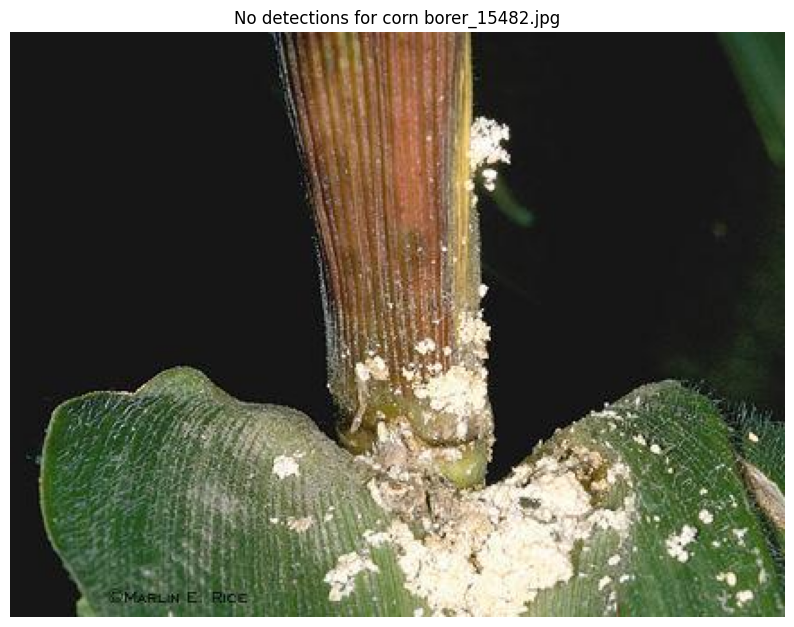

Predicting on Test Images:   3%|▎         | 1/29 [00:00<00:15,  1.86it/s]


image 1/1 /kaggle/input/pest-test-images/Termite_Aug_SL8 Microtermes obesi Holmgren_178.jpg: 640x640 (no detections), 9.7ms
Speed: 2.7ms preprocess, 9.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Image: Termite_Aug_SL8 Microtermes obesi Holmgren_178.jpg, No detections by YOLOv8


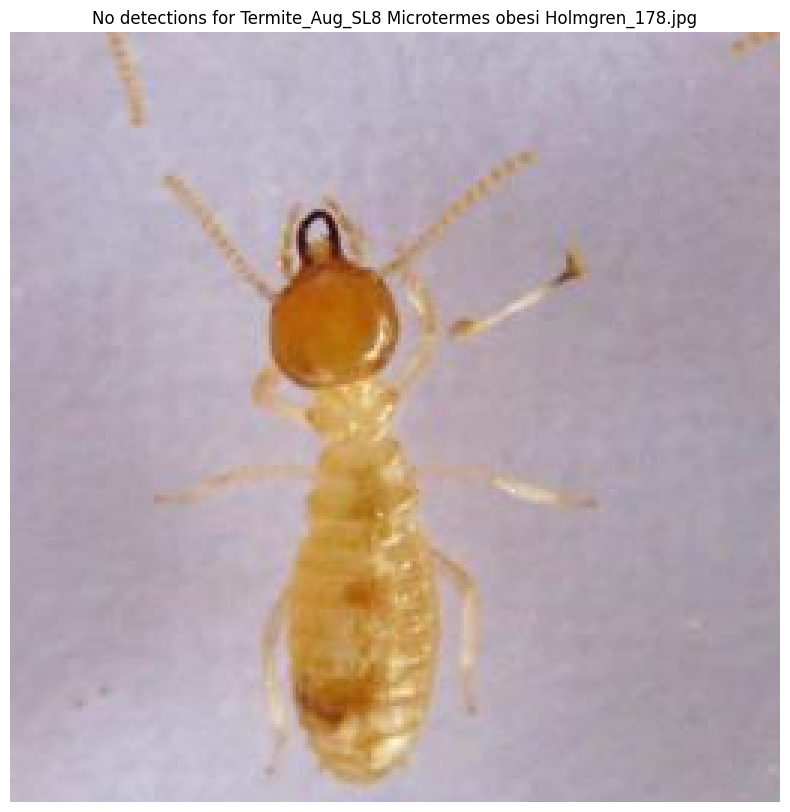

Predicting on Test Images:   7%|▋         | 2/29 [00:00<00:08,  3.05it/s]


image 1/1 /kaggle/input/pest-test-images/white backed plant hopper_05156.jpg: 640x640 (no detections), 8.8ms
Speed: 3.0ms preprocess, 8.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Image: white backed plant hopper_05156.jpg, No detections by YOLOv8


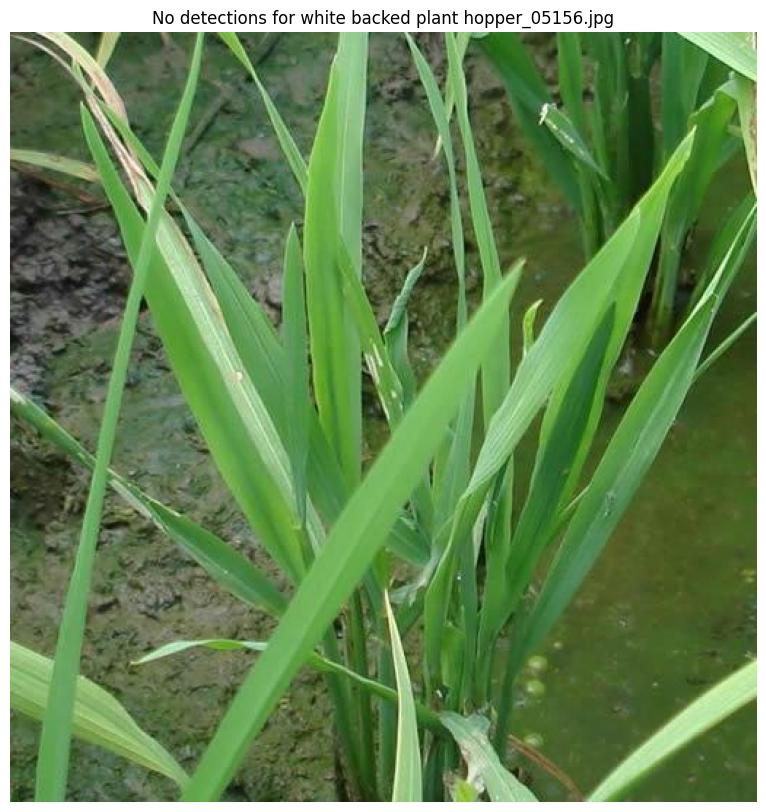

Predicting on Test Images:  10%|█         | 3/29 [00:01<00:10,  2.36it/s]


image 1/1 /kaggle/input/pest-test-images/cutworm_92.Black-Cutworm.jpg: 480x640 1 black cutworm, 1 yellow cutworm, 9.9ms
Speed: 2.4ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)
Image: cutworm_92.Black-Cutworm.jpg, YOLO: yellow cutworm (0.38), Swin: large cutworm (0.46), Box: (205, 105, 429, 355)
Image: cutworm_92.Black-Cutworm.jpg, YOLO: black cutworm (0.26), Swin: large cutworm (0.61), Box: (206, 104, 432, 355)


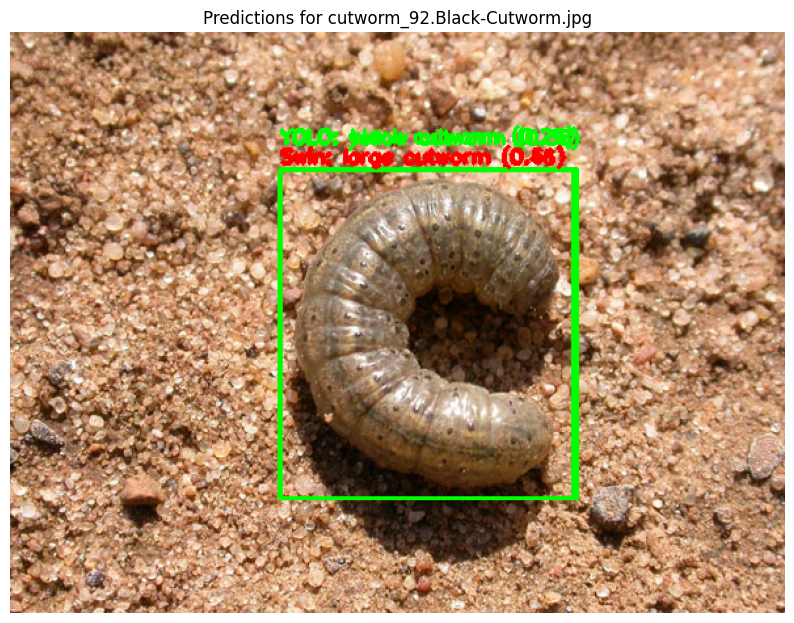

Predicting on Test Images:  14%|█▍        | 4/29 [00:01<00:12,  2.08it/s]


image 1/1 /kaggle/input/pest-test-images/alfalfa weevil_30721.jpg: 448x640 1 beet weevil, 52.5ms
Speed: 2.3ms preprocess, 52.5ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Image: alfalfa weevil_30721.jpg, YOLO: beet weevil (0.59), Swin: beet weevil (1.00), Box: (80, 90, 437, 297)


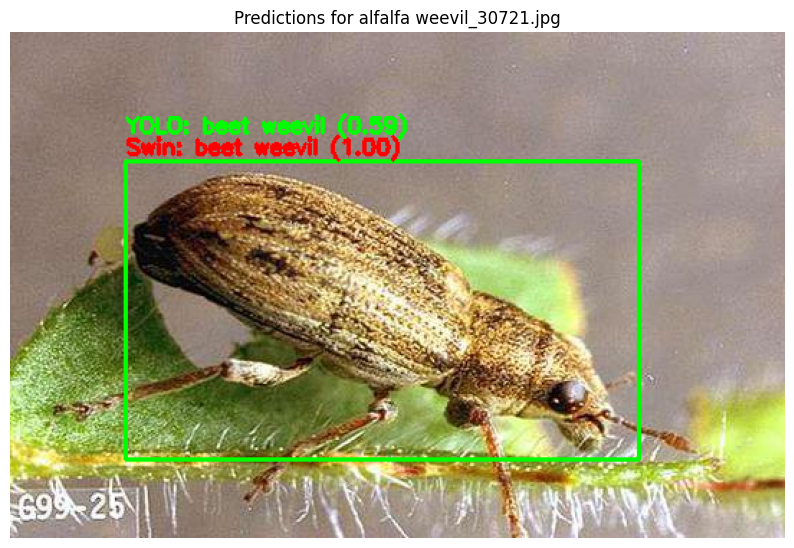

Predicting on Test Images:  17%|█▋        | 5/29 [00:02<00:11,  2.12it/s]


image 1/1 /kaggle/input/pest-test-images/grasshopper_jpg_22 - Copy.jpg: 384x640 1 Cicadellidae, 52.2ms
Speed: 1.7ms preprocess, 52.2ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)
Image: grasshopper_jpg_22 - Copy.jpg, YOLO: Cicadellidae (0.34), Swin: Locustoidea (0.94), Box: (0, 12, 258, 162)


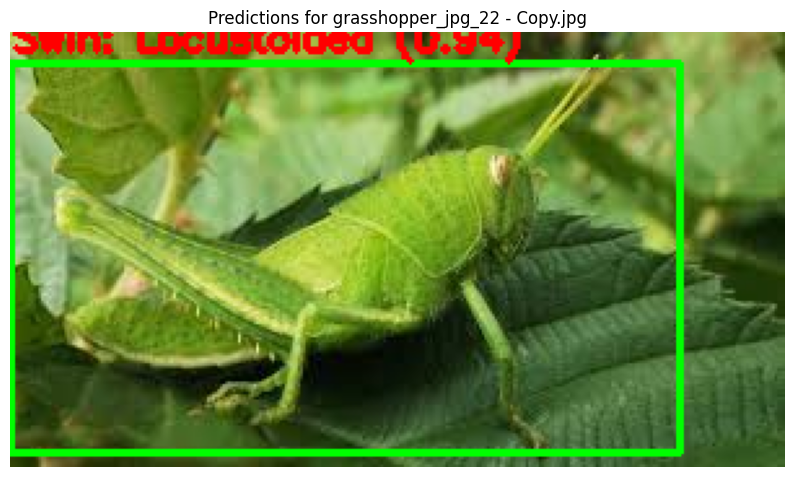

Predicting on Test Images:  21%|██        | 6/29 [00:02<00:10,  2.17it/s]


image 1/1 /kaggle/input/pest-test-images/Pod borer_Aug_Earias cupreoviridis Walker_357.jpg: 640x640 1 Adristyrannus, 9.6ms
Speed: 2.5ms preprocess, 9.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
Image: Pod borer_Aug_Earias cupreoviridis Walker_357.jpg, YOLO: Adristyrannus (0.34), Swin: aphids (0.83), Box: (2, 57, 222, 256)


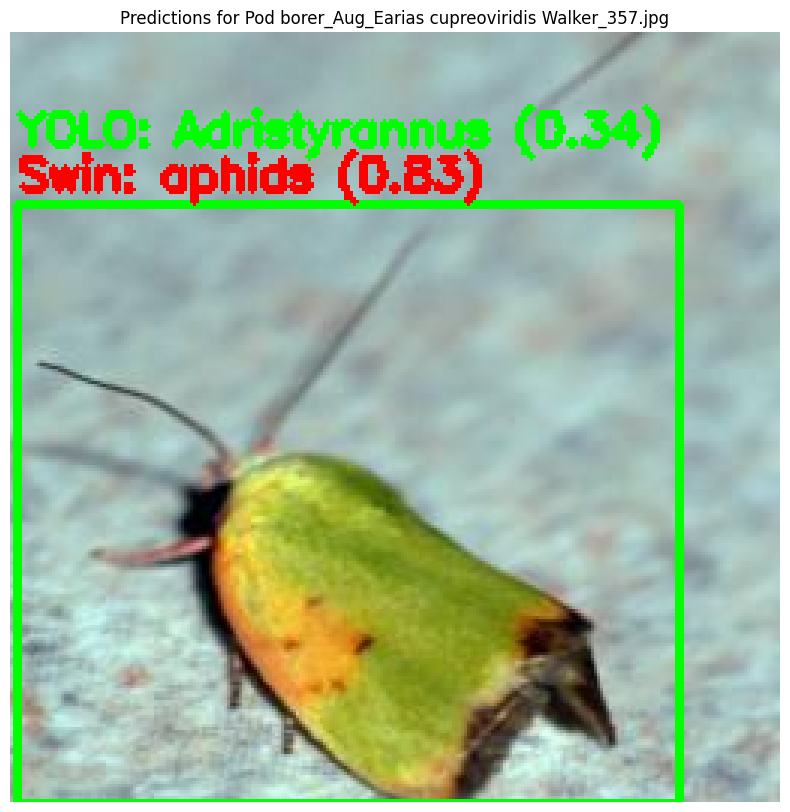

Predicting on Test Images:  24%|██▍       | 7/29 [00:02<00:08,  2.62it/s]


image 1/1 /kaggle/input/pest-test-images/grub_08463.jpg: 480x640 1 grub, 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Image: grub_08463.jpg, YOLO: grub (0.45), Swin: grub (1.00), Box: (140, 286, 300, 375)


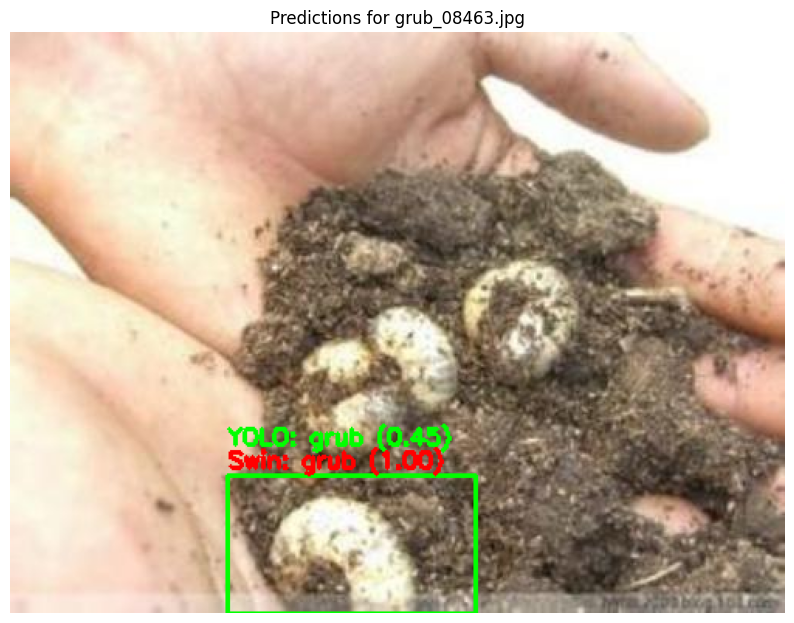

Predicting on Test Images:  28%|██▊       | 8/29 [00:03<00:08,  2.50it/s]


image 1/1 /kaggle/input/pest-test-images/Viteus vitifoliae_42695.jpg: 480x640 (no detections), 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)
Image: Viteus vitifoliae_42695.jpg, No detections by YOLOv8


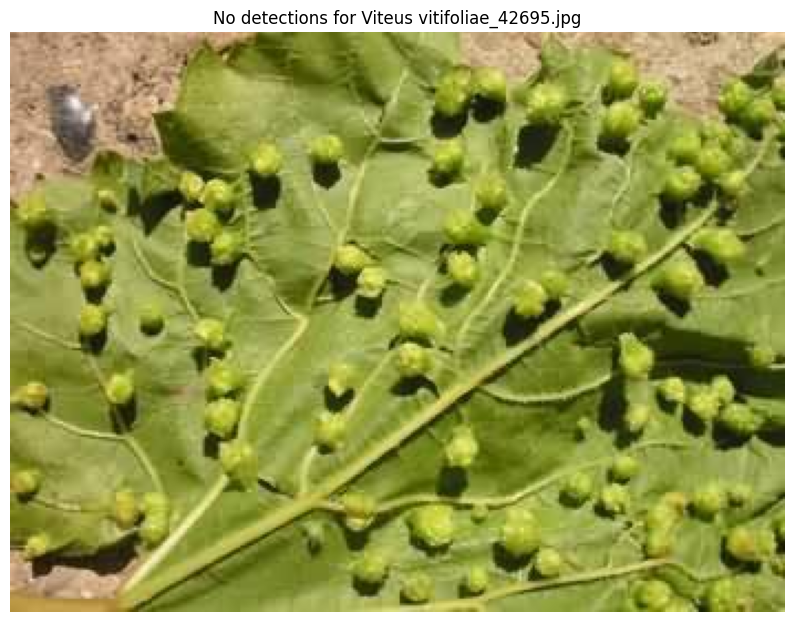

Predicting on Test Images:  31%|███       | 9/29 [00:03<00:08,  2.45it/s]


image 1/1 /kaggle/input/pest-test-images/Jute aphid_Aug_Aphis gossypii Glover_355.jpg: 640x640 1 english grain aphid, 1 Unaspis yanonensis, 1 Chrysomphalus aonidum, 12.8ms
Speed: 3.6ms preprocess, 12.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)
Image: Jute aphid_Aug_Aphis gossypii Glover_355.jpg, YOLO: english grain aphid (0.62), Swin: Ceroplastes rubens (0.94), Box: (0, 72, 50, 146)
Image: Jute aphid_Aug_Aphis gossypii Glover_355.jpg, YOLO: Unaspis yanonensis (0.39), Swin: english grain aphid (0.89), Box: (194, 27, 255, 70)
Image: Jute aphid_Aug_Aphis gossypii Glover_355.jpg, YOLO: Chrysomphalus aonidum (0.33), Swin: english grain aphid (0.46), Box: (134, 78, 189, 129)


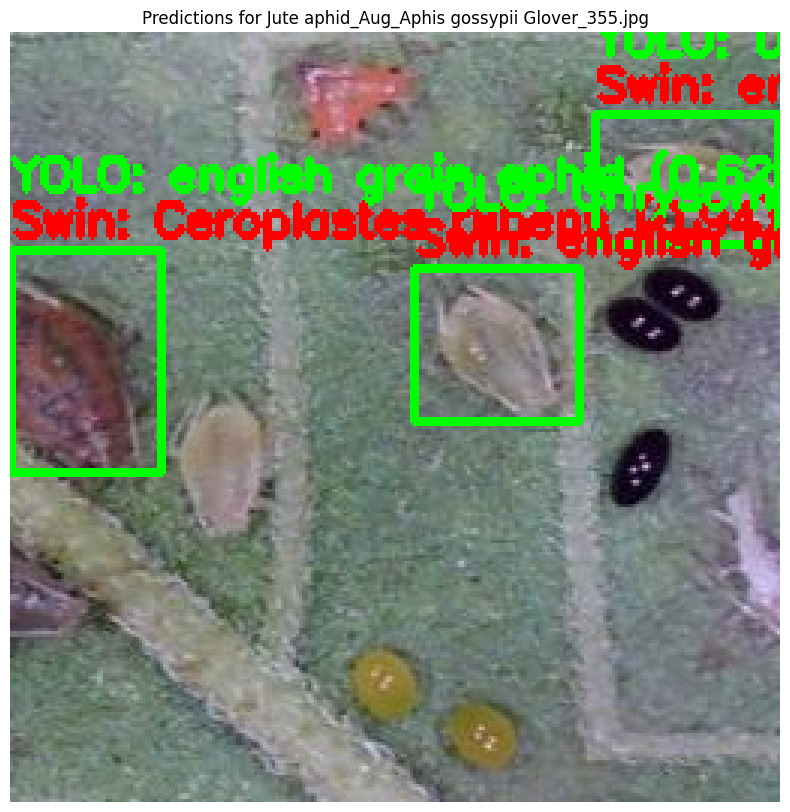

Predicting on Test Images:  34%|███▍      | 10/29 [00:04<00:07,  2.65it/s]


image 1/1 /kaggle/input/pest-test-images/Colomerus vitis_42889.jpg: 640x640 (no detections), 8.9ms
Speed: 2.7ms preprocess, 8.9ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 640)
Image: Colomerus vitis_42889.jpg, No detections by YOLOv8


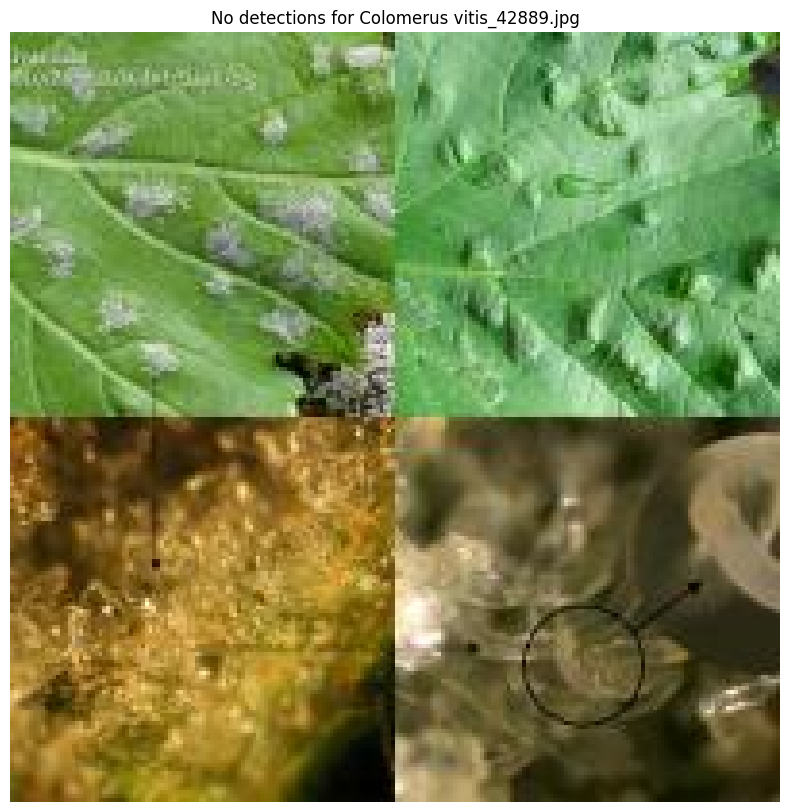

Predicting on Test Images:  38%|███▊      | 11/29 [00:04<00:05,  3.07it/s]


image 1/1 /kaggle/input/pest-test-images/Lycorma delicatula_49472.jpg: 640x512 1 Lycorma delicatula, 50.6ms
Speed: 2.1ms preprocess, 50.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 512)
Image: Lycorma delicatula_49472.jpg, YOLO: Lycorma delicatula (0.67), Swin: Lycorma delicatula (1.00), Box: (31, 66, 185, 261)


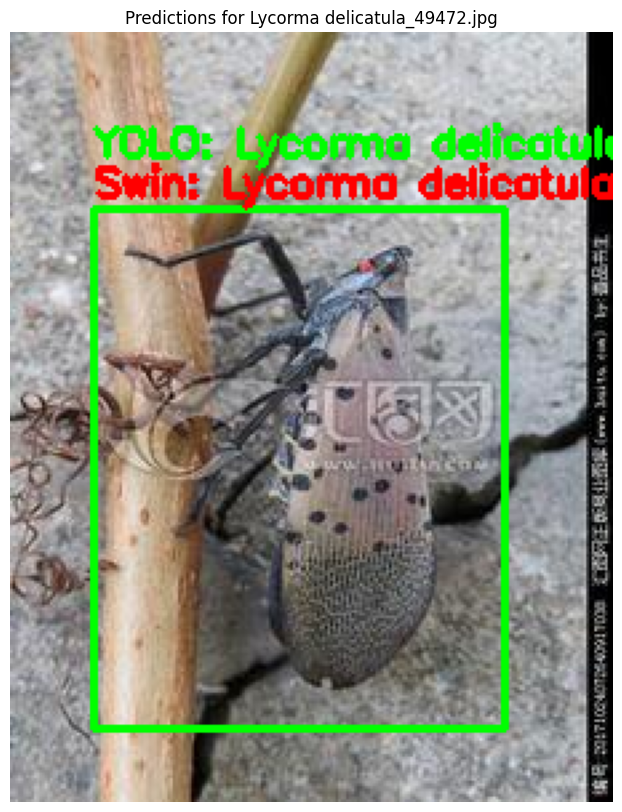

Predicting on Test Images:  41%|████▏     | 12/29 [00:04<00:06,  2.58it/s]


image 1/1 /kaggle/input/pest-test-images/rice leaf roller_00316.jpg: 512x640 (no detections), 9.1ms
Speed: 2.6ms preprocess, 9.1ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)
Image: rice leaf roller_00316.jpg, No detections by YOLOv8


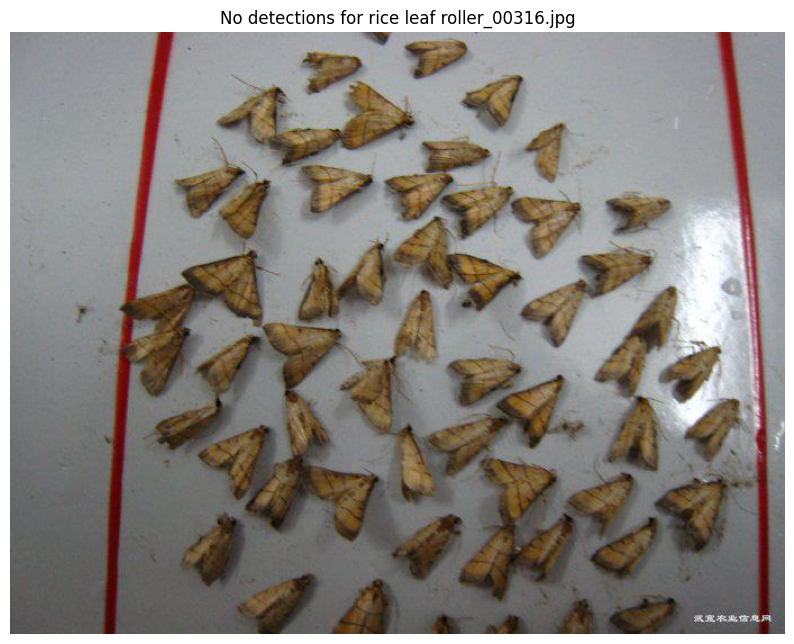

Predicting on Test Images:  45%|████▍     | 13/29 [00:05<00:06,  2.43it/s]


image 1/1 /kaggle/input/pest-test-images/longlegged spider mite_24851.jpg: 448x640 1 penthaleus major, 1 longlegged spider mite, 11.6ms
Speed: 2.9ms preprocess, 11.6ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Image: longlegged spider mite_24851.jpg, YOLO: longlegged spider mite (0.60), Swin: longlegged spider mite (1.00), Box: (191, 204, 653, 452)
Image: longlegged spider mite_24851.jpg, YOLO: penthaleus major (0.32), Swin: longlegged spider mite (1.00), Box: (185, 200, 651, 450)


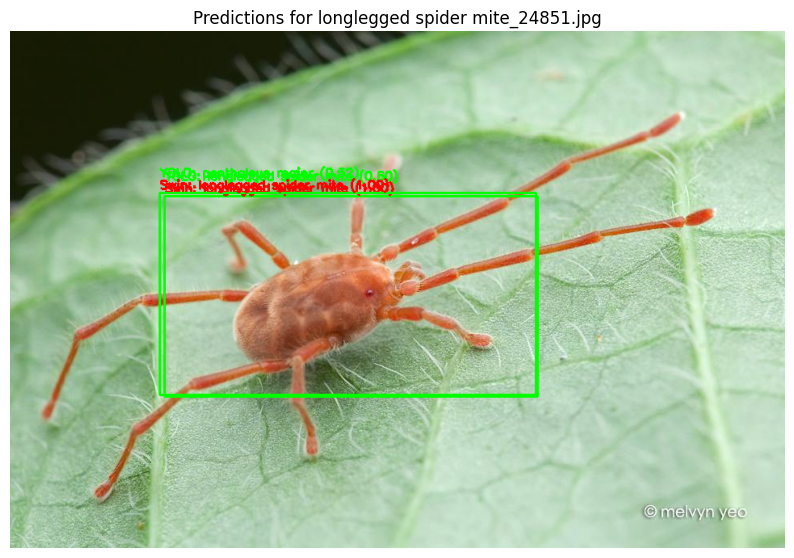

Predicting on Test Images:  48%|████▊     | 14/29 [00:05<00:06,  2.29it/s]


image 1/1 /kaggle/input/pest-test-images/Miridae_55971.jpg: 480x640 1 tarnished plant bug, 1 Miridae, 8.4ms
Speed: 2.6ms preprocess, 8.4ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)
Image: Miridae_55971.jpg, YOLO: Miridae (0.53), Swin: Miridae (0.40), Box: (13, 0, 498, 358)
Image: Miridae_55971.jpg, YOLO: tarnished plant bug (0.27), Swin: tarnished plant bug (0.91), Box: (37, 0, 434, 359)


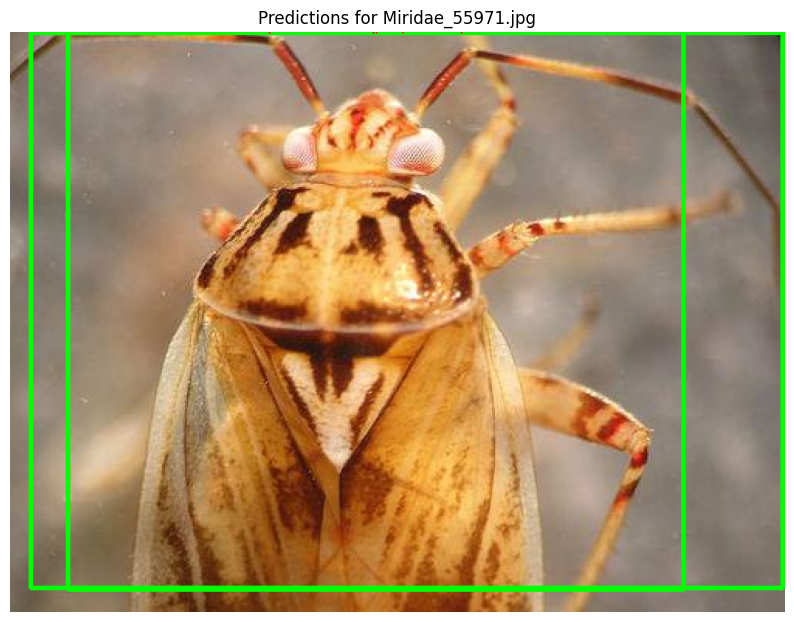

Predicting on Test Images:  52%|█████▏    | 15/29 [00:06<00:06,  2.24it/s]


image 1/1 /kaggle/input/pest-test-images/flea beetle_26688.jpg: 448x640 1 mole cricket, 8.3ms
Speed: 2.8ms preprocess, 8.3ms inference, 2.2ms postprocess per image at shape (1, 3, 448, 640)
Image: flea beetle_26688.jpg, YOLO: mole cricket (0.34), Swin: grub (0.86), Box: (699, 433, 2040, 1213)


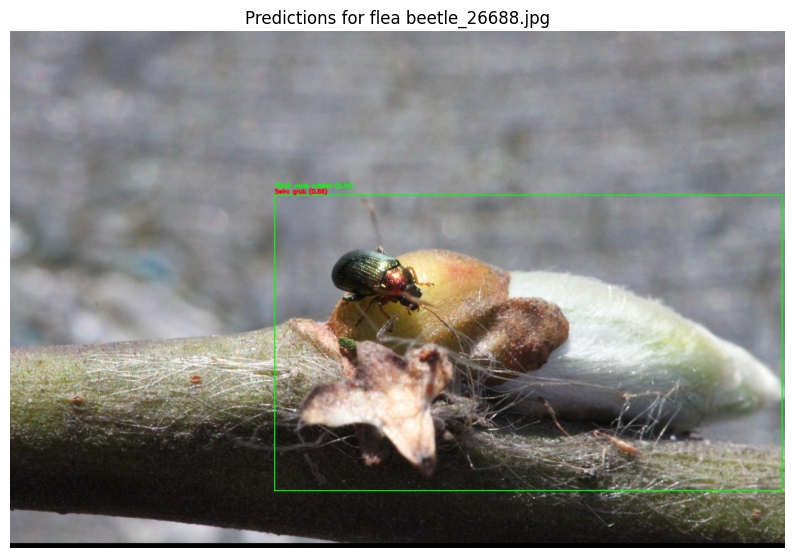

Predicting on Test Images:  55%|█████▌    | 16/29 [00:07<00:07,  1.81it/s]


image 1/1 /kaggle/input/pest-test-images/Jute stem girdler_Aug_Nupserha bicolor (Dutta)_147.jpg: 640x640 1 Rhytidodera bowrinii white, 9.8ms
Speed: 2.8ms preprocess, 9.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)
Image: Jute stem girdler_Aug_Nupserha bicolor (Dutta)_147.jpg, YOLO: Rhytidodera bowrinii white (0.88), Swin: blister beetle (0.98), Box: (6, 15, 256, 254)


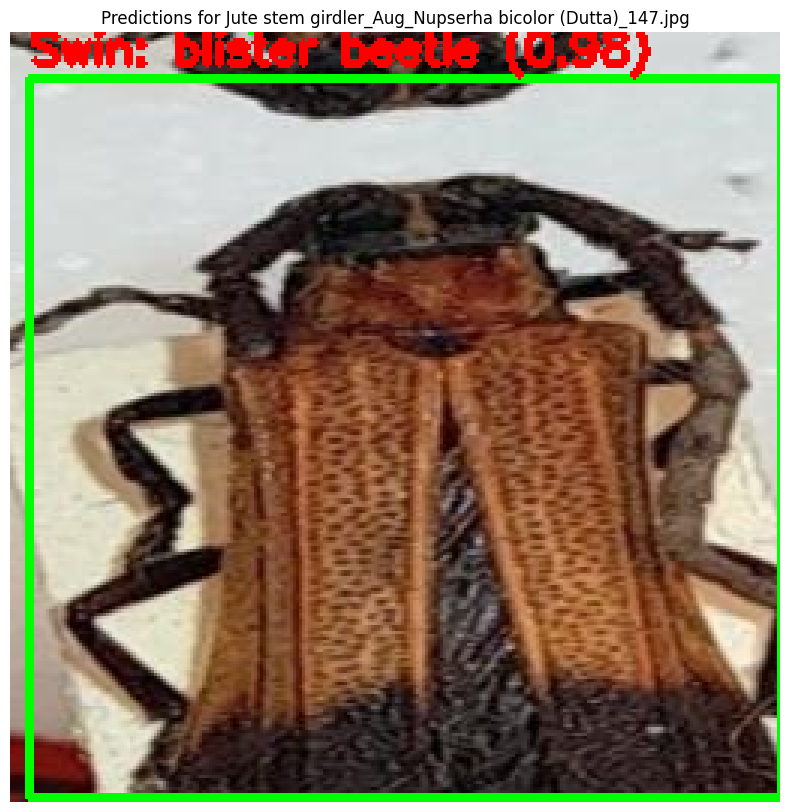

Predicting on Test Images:  59%|█████▊    | 17/29 [00:07<00:05,  2.22it/s]


image 1/1 /kaggle/input/pest-test-images/blister beetle_37576.jpg: 448x640 1 blister beetle, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)
Image: blister beetle_37576.jpg, YOLO: blister beetle (0.73), Swin: blister beetle (1.00), Box: (18, 64, 268, 329)


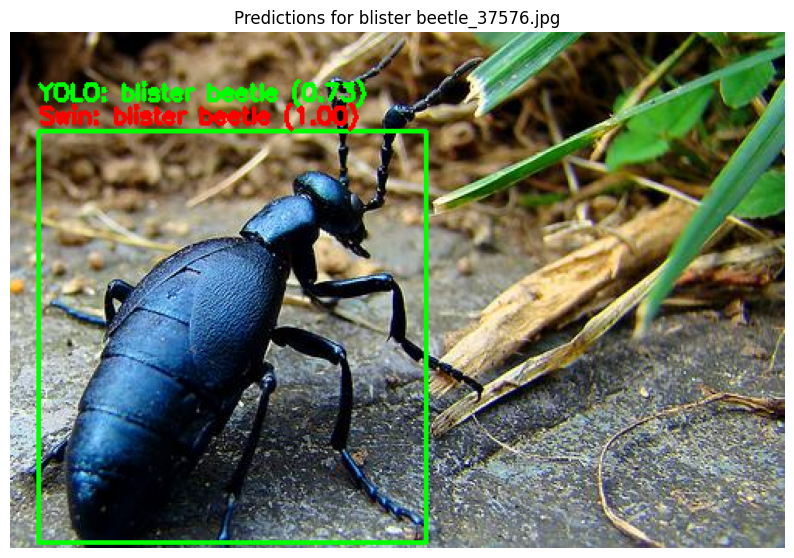

Predicting on Test Images:  62%|██████▏   | 18/29 [00:07<00:05,  2.16it/s]


image 1/1 /kaggle/input/pest-test-images/rice leafhopper_07692.jpg: 608x640 2 rice leafhoppers, 49.2ms
Speed: 4.1ms preprocess, 49.2ms inference, 1.8ms postprocess per image at shape (1, 3, 608, 640)
Image: rice leafhopper_07692.jpg, YOLO: rice leafhopper (0.71), Swin: Rhytidodera bowrinii white (0.31), Box: (143, 176, 248, 295)
Image: rice leafhopper_07692.jpg, YOLO: rice leafhopper (0.69), Swin: rice leafhopper (0.87), Box: (121, 76, 220, 195)


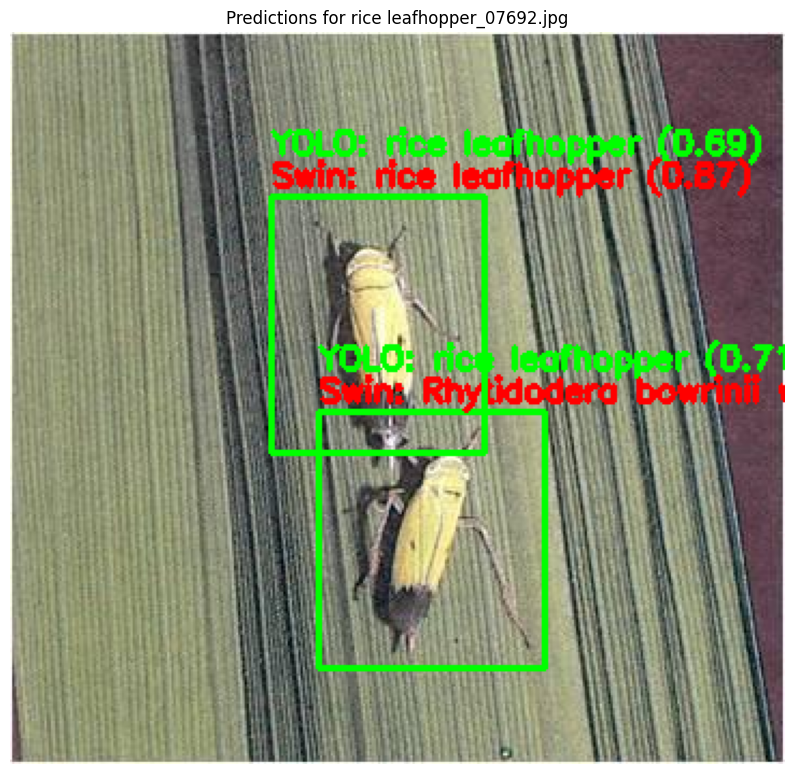

Predicting on Test Images:  66%|██████▌   | 19/29 [00:08<00:05,  1.99it/s]


image 1/1 /kaggle/input/pest-test-images/whitefly_th62 (3).jpg: 448x640 1 Phyllocnistis citrella Stainton, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)
Image: whitefly_th62 (3).jpg, YOLO: Phyllocnistis citrella Stainton (0.35), Swin: Erythroneura apicalis (0.82), Box: (48, 14, 211, 146)


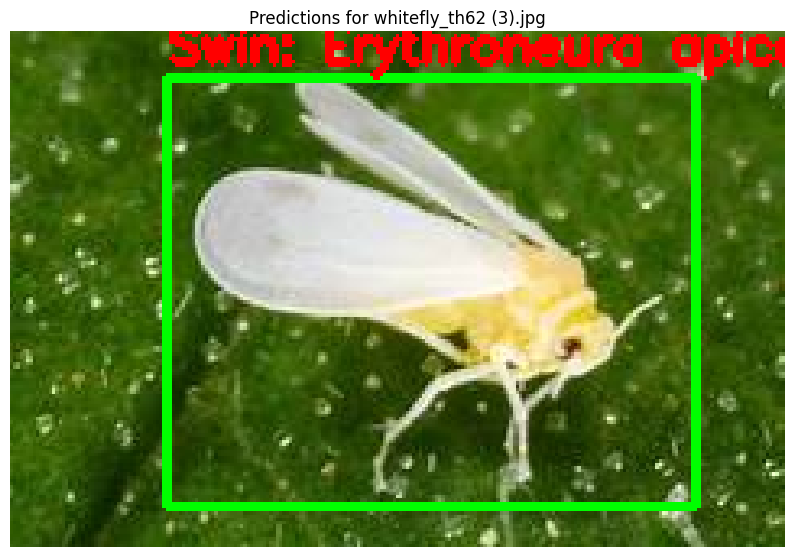

Predicting on Test Images:  69%|██████▉   | 20/29 [00:08<00:03,  2.45it/s]


image 1/1 /kaggle/input/pest-test-images/mole cricket_09325.jpg: 448x640 1 mole cricket, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)
Image: mole cricket_09325.jpg, YOLO: mole cricket (0.75), Swin: mole cricket (1.00), Box: (50, 65, 399, 232)


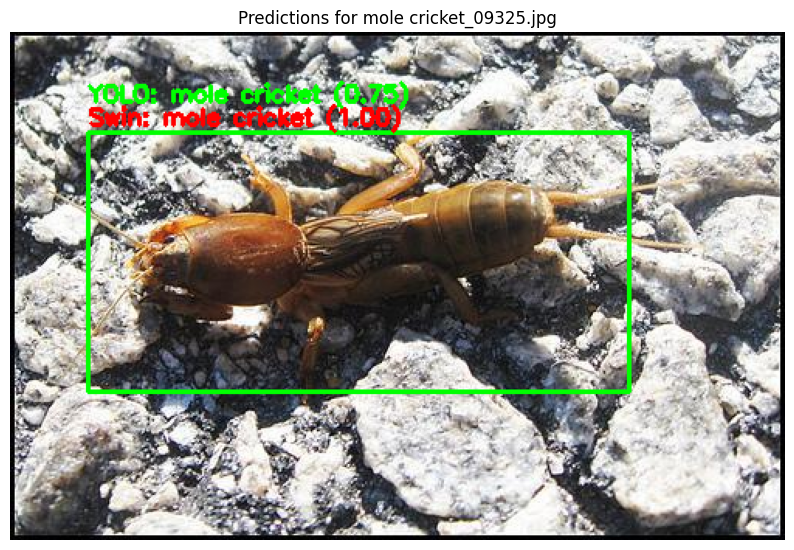

Predicting on Test Images:  72%|███████▏  | 21/29 [00:09<00:03,  2.36it/s]


image 1/1 /kaggle/input/pest-test-images/aphids_19786.jpg: 448x640 (no detections), 8.3ms
Speed: 2.1ms preprocess, 8.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)
Image: aphids_19786.jpg, No detections by YOLOv8


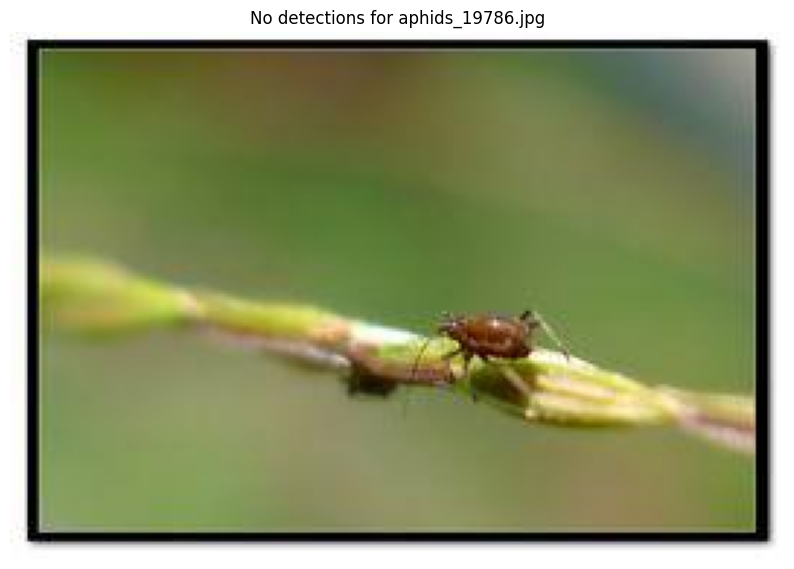

Predicting on Test Images:  76%|███████▌  | 22/29 [00:09<00:02,  2.60it/s]


image 1/1 /kaggle/input/pest-test-images/red spider_14111.jpg: 480x640 1 yellow cutworm, 9.0ms
Speed: 1.7ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)
Image: red spider_14111.jpg, YOLO: yellow cutworm (0.27), Swin: Ampelophaga (0.29), Box: (0, 1, 639, 477)


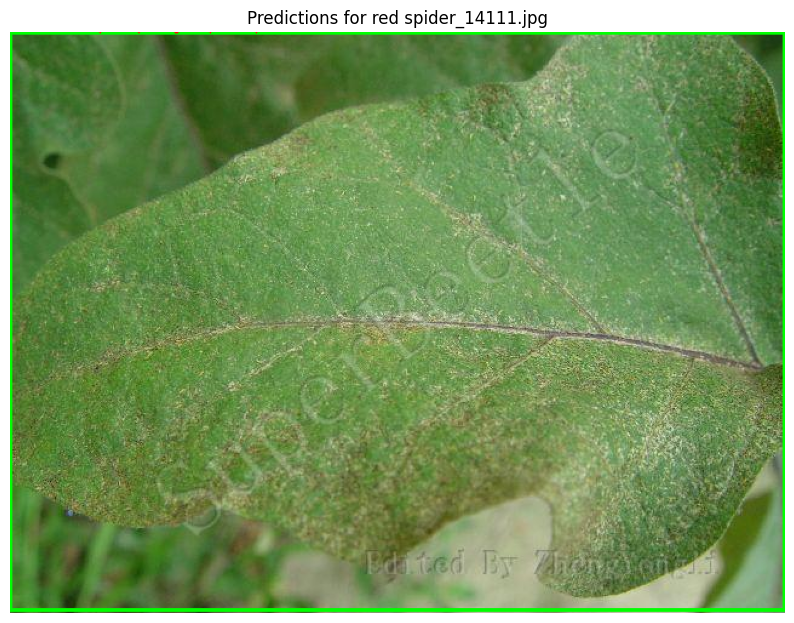

Predicting on Test Images:  79%|███████▉  | 23/29 [00:09<00:02,  2.38it/s]


image 1/1 /kaggle/input/pest-test-images/black cutworm_12184.jpg: 512x640 1 black cutworm, 9.2ms
Speed: 2.4ms preprocess, 9.2ms inference, 2.0ms postprocess per image at shape (1, 3, 512, 640)
Image: black cutworm_12184.jpg, YOLO: black cutworm (0.64), Swin: black cutworm (0.86), Box: (18, 55, 276, 182)


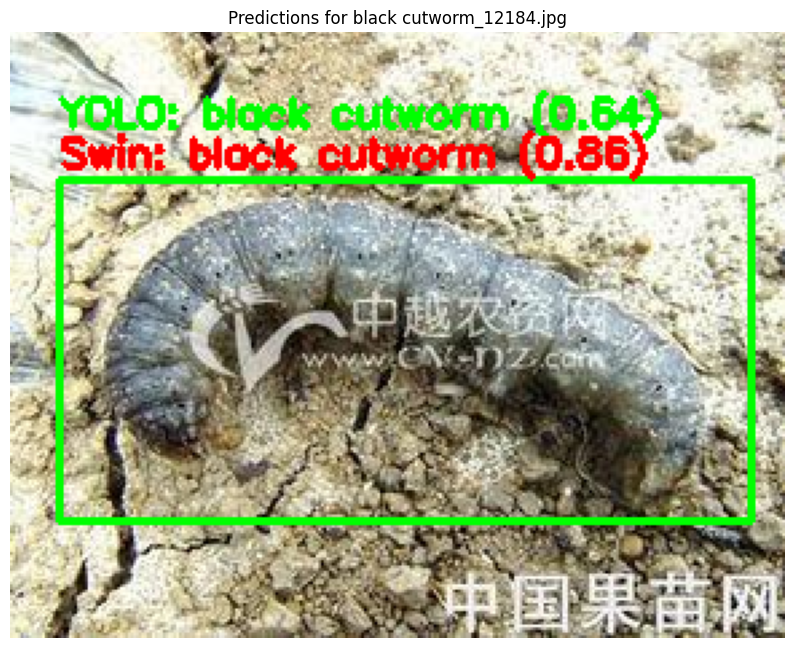

Predicting on Test Images:  83%|████████▎ | 24/29 [00:10<00:02,  2.26it/s]


image 1/1 /kaggle/input/pest-test-images/Unaspis yanonensis_60039.jpg: 512x640 (no detections), 7.8ms
Speed: 3.0ms preprocess, 7.8ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)
Image: Unaspis yanonensis_60039.jpg, No detections by YOLOv8


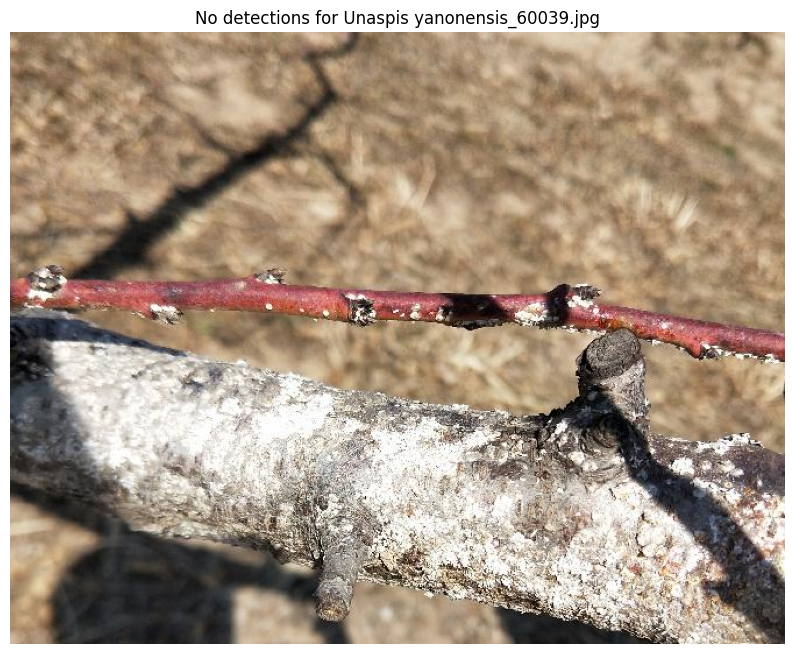

Predicting on Test Images:  86%|████████▌ | 25/29 [00:10<00:01,  2.21it/s]


image 1/1 /kaggle/input/pest-test-images/Jute hairy_spilosoma_obliqua_0_2232.jpg: 640x640 (no detections), 9.5ms
Speed: 2.7ms preprocess, 9.5ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Image: Jute hairy_spilosoma_obliqua_0_2232.jpg, No detections by YOLOv8


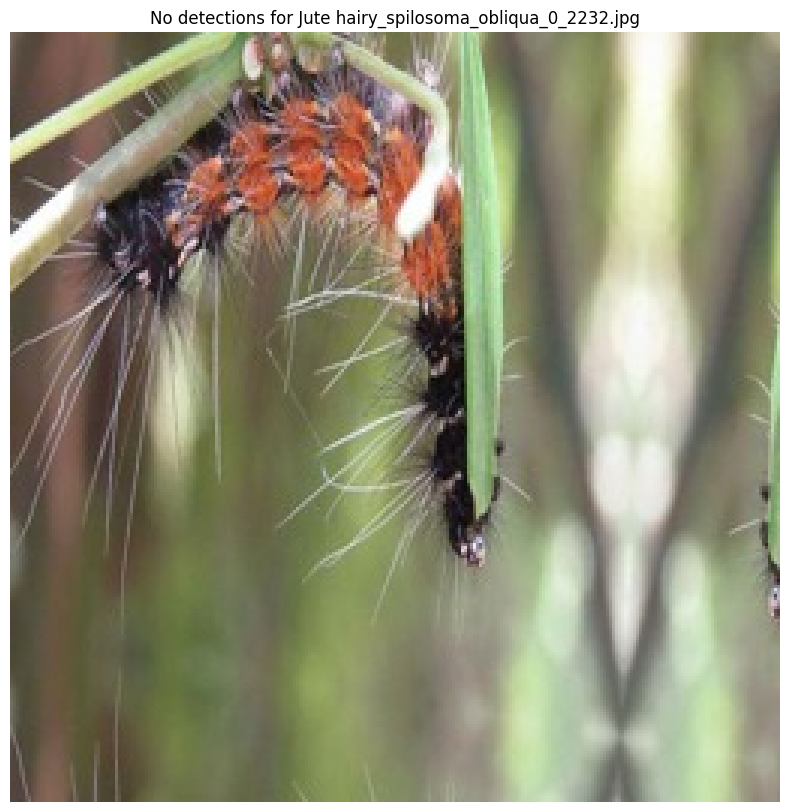

Predicting on Test Images:  90%|████████▉ | 26/29 [00:10<00:01,  2.65it/s]


image 1/1 /kaggle/input/pest-test-images/alfalfa plant bug_32415.jpg: 448x640 1 Miridae, 8.8ms
Speed: 2.5ms preprocess, 8.8ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)
Image: alfalfa plant bug_32415.jpg, YOLO: Miridae (0.31), Swin: alfalfa plant bug (0.55), Box: (42, 62, 578, 345)


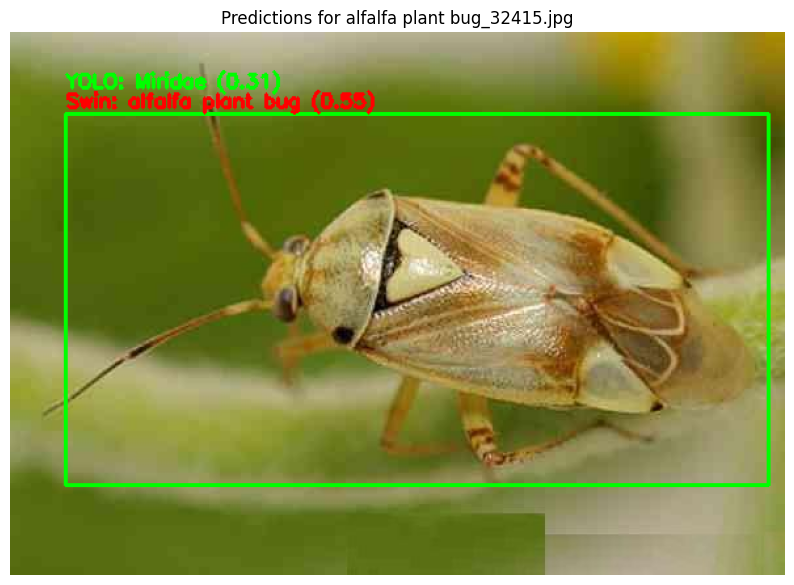

Predicting on Test Images:  93%|█████████▎| 27/29 [00:11<00:00,  2.67it/s]


image 1/1 /kaggle/input/pest-test-images/sawfly_jpg_44.jpg: 448x640 1 Aleurocanthus spiniferus, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
Image: sawfly_jpg_44.jpg, YOLO: Aleurocanthus spiniferus (0.56), Swin: Aleurocanthus spiniferus (0.72), Box: (0, 6, 252, 176)


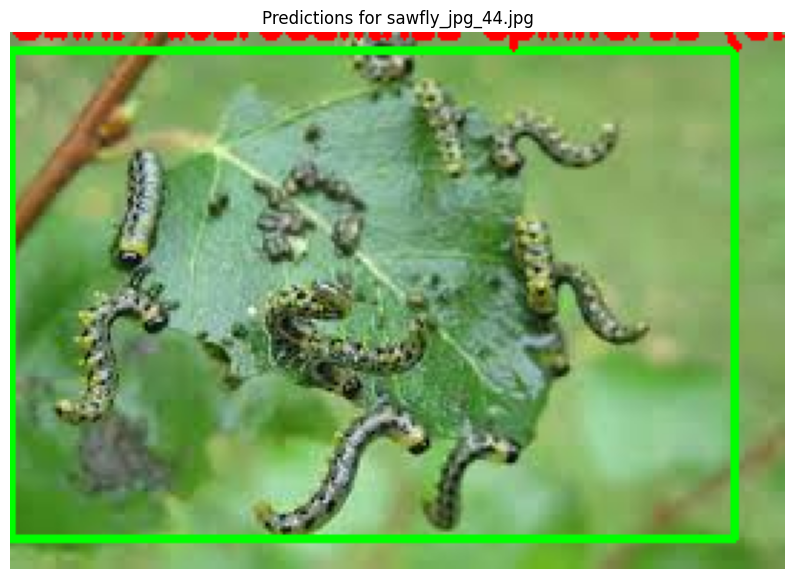

Predicting on Test Images:  97%|█████████▋| 28/29 [00:11<00:00,  2.63it/s]


image 1/1 /kaggle/input/pest-test-images/mites_jpg_10 - Copy (4).jpg: 512x640 (no detections), 9.3ms
Speed: 3.1ms preprocess, 9.3ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)
Image: mites_jpg_10 - Copy (4).jpg, No detections by YOLOv8


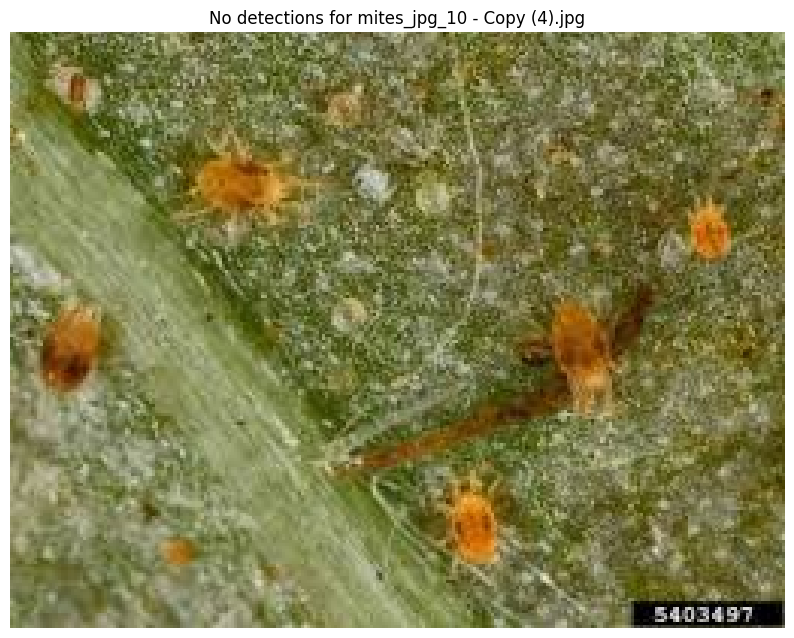

Predicting on Test Images: 100%|██████████| 29/29 [00:11<00:00,  2.43it/s]

Prediction and visualization completed.


In [26]:
import os
import cv2
import torch
from ultralytics import YOLO
import torchvision
from torchvision import transforms
from pathlib import Path
from tqdm import tqdm
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Paths
OUTPUT_DIR = "/kaggle/working/IP102_YOLOv5"
TEST_IMG_DIR = "/kaggle/input/pest-test-images"


# Ensure the list has exactly 102 entries; adjust based on your dataset
class_names = [
    'rice leaf roller', 'rice leaf caterpillar', 'paddy stem maggot', 'asiatic rice borer', 'yellow rice borer',
    'rice gall midge', 'Rice Stemfly', 'brown plant hopper', 'white backed plant hopper', 'small brown plant hopper',
    'rice water weevil', 'rice leafhopper', 'grain spreader thrips', 'rice shell pest', 'grub', 'mole cricket', 'wireworm',
    'white margined moth', 'black cutworm', 'large cutworm', 'yellow cutworm', 'red spider', 'corn borer', 'army worm', 'aphids',
    'Potosiabre vitarsis', 'peach borer', 'english grain aphid', 'green bug', 'bird cherry-oataphid', 'wheat blossom midge',
    'penthaleus major', 'longlegged spider mite', 'wheat phloeothrips', 'wheat sawfly', 'cerodonta denticornis', 'beet fly',
    'flea beetle', 'cabbage army worm', 'beet army worm', 'Beet spot flies', 'meadow moth', 'beet weevil', 'sericaorient alismots chulsky',
    'alfalfa weevil', 'flax budworm', 'alfalfa plant bug', 'tarnished plant bug', 'Locustoidea', 'lytta polita', 'legume blister beetle',
    'blister beetle', 'therioaphis maculata Buckton', 'odontothrips loti', 'Thrips', 'alfalfa seed chalcid', 'Pieris canidia',
    'Apolygus lucorum', 'Limacodidae', 'Viteus vitifoliae', 'Colomerus vitis', 'Brevipoalpus lewisi McGregor', 'oides decempunctata',
    'Polyphagotars onemus latus', 'Pseudococcus comstocki Kuwana', 'parathrene regalis', 'Ampelophaga', 'Lycorma delicatula', 'Xylotrechus',
    'Cicadella viridis', 'Miridae', 'Trialeurodes vaporariorum', 'Erythroneura apicalis', 'Papilio xuthus', 'Panonchus citri McGregor',
    'Phyllocoptes oleiverus ashmead', 'Icerya purchasi Maskell', 'Unaspis yanonensis', 'Ceroplastes rubens', 'Chrysomphalus aonidum',
    'Parlatoria zizyphus Lucus', 'Nipaecoccus vastalor', 'Aleurocanthus spiniferus', 'Tetradacus c Bactrocera minax ', 'Dacus dorsalis(Hendel)',
    'Bactrocera tsuneonis', 'Prodenia litura', 'Adristyrannus', 'Phyllocnistis citrella Stainton', 'Toxoptera citricidus', 'Toxoptera aurantii',
    'Aphis citricola Vander Goot', 'Scirtothrips dorsalis Hood', 'Dasineura sp', 'Lawana imitata Melichar', 'Salurnis marginella Guerr',
    'Deporaus marginatus Pascoe', 'Chlumetia transversa', 'Mango flat beak leafhopper', 'Rhytidodera bowrinii white', 'Sternochetus frigidus',
    'Cicadellidae'
]

# Load YOLOv8 model
yolo_model = YOLO("/kaggle/input/yolo-pest-detection-weights/best.pt")
yolo_model.to(device)

# Load Swin Transformer model
swin_model = torchvision.models.swin_t(weights=None)
swin_model.head = torch.nn.Linear(swin_model.head.in_features, 102)
swin_model.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "swin_ip102.pth")))
swin_model.to(device)
swin_model.eval()

# Transform for Swin input
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# Function to extract and classify ROIs
def process_image(image_path):
    # YOLOv8 detection
    results = yolo_model(image_path)
    img = cv2.imread(image_path)
    if img is None:
        print(f"Failed to load image: {image_path}")
        return None, []
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape
    predictions = []

    if not results[0].boxes:  # No detections
        print(f"Image: {Path(image_path).name}, No detections by YOLOv8")
        return img, predictions

    for result in results[0].boxes:
        x1, y1, x2, y2 = map(int, result.xyxy[0].tolist())
        conf = result.conf[0].item()
        cls = int(result.cls[0].item())
        # Check if class index is valid
        if cls >= len(class_names):
            print(f"Invalid class index {cls} for image {Path(image_path).name}, skipping detection")
            continue
        yolo_label = class_names[cls]

        # Crop ROI
        roi = img[y1:y2, x1:x2]
        if roi.size == 0:
            print(f"Empty ROI for {Path(image_path).name} at {x1, y1, x2, y2}")
            continue
        roi = cv2.resize(roi, (224, 224))
        roi = transform(roi).unsqueeze(0).to(device)  # Add batch dimension

        # Swin Transformer classification
        with torch.no_grad():
            swin_output = swin_model(roi)
            _, swin_pred = torch.max(swin_output, 1)
            swin_label = class_names[swin_pred.item()]
            swin_conf = torch.softmax(swin_output, dim=1)[0, swin_pred.item()].item()

        predictions.append((x1, y1, x2, y2, yolo_label, conf, swin_label, swin_conf))

    return img, predictions

# Function to plot bounding boxes with dual labels (display instead of save)
def plot_bounding_boxes(image, predictions, image_path):
    if not predictions:
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"No detections for {Path(image_path).name}")
        plt.show()
        return

    for x1, y1, x2, y2, yolo_label, yolo_conf, swin_label, swin_conf in predictions:
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, f"YOLO: {yolo_label} ({yolo_conf:.2f})", (x1, y1 - 20),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)
        cv2.putText(image, f"Swin: {swin_label} ({swin_conf:.2f})", (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Predictions for {Path(image_path).name}")
    plt.show()

# Process test images
test_images = [f for f in os.listdir(TEST_IMG_DIR) if f.endswith('.jpg')]
for img_file in tqdm(test_images, desc="Predicting on Test Images"):
    img_path = os.path.join(TEST_IMG_DIR, img_file)
    image, predictions = process_image(img_path)
    if image is None:
        continue
    for x1, y1, x2, y2, yolo_label, yolo_conf, swin_label, swin_conf in predictions:
        print(f"Image: {img_file}, YOLO: {yolo_label} ({yolo_conf:.2f}), Swin: {swin_label} ({swin_conf:.2f}), Box: ({x1}, {y1}, {x2}, {y2})")
    plot_bounding_boxes(image, predictions, img_path)

print("Prediction and visualization completed.")